# Deep Learning - Transfer Learning

Deep learning is a subset of machine learning, which is essentially a neural network with three or more layers. These neural networks attempt to simulate the behavior of the human brain—albeit far from matching its ability—allowing it to “learn” from large amounts of data. While a neural network with a single layer can still make approximate predictions, additional hidden layers can help to optimize and refine for accuracy.

Deep learning drives many artificial intelligence (AI) applications and services that improve automation, performing analytical and physical tasks without human intervention. Deep learning technology lies behind everyday products and services (such as digital assistants, voice-enabled TV remotes, and credit card fraud detection) as well as emerging technologies (such as self-driving cars).

Transfer learning is a powerful technique used in Deep Learning. By harnessing the ability to reuse existing models and their knowledge of new problems, transfer learning has opened doors to training deep neural networks even with limited data. This breakthrough is especially significant in data science, where practical scenarios often need more labeled data. In this article, we delve into the depths of transfer learning, unraveling its concepts and exploring its applications in empowering data scientists to tackle complex challenges with newfound efficiency and effectiveness.

Install the Augmentor package via the terminal

In [1]:
!pip install Augmentor

## Imports

In [2]:
import os
import cv2
import tarfile
import numpy as np
from urllib import request
import pandas as pd
from google.colab.patches import cv2_imshow
import Augmentor
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG16
from google.colab import drive
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc

Mount the Google Drive to access our datasets and relevant files stored there. We set up the base path for our project's data and ensure that the necessary directories exist.

In [3]:
# mount Google drive
drive.mount('/content/drive')

# define base directory
base_path = "/content/sample_data/deep_learning_assignment"
if not os.path.isdir(base_path):
  os.makedirs(base_path)

Mounted at /content/drive


Download the VGG Face Dataset, a large-scale face recognition dataset. Additionally, it downloads the Haar Cascade XML file used for face detection, an essential part of preprocessing in our face recognition task.

In [4]:
faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontal_face_default.xml")) # haar cascade detects faces in images

vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
  f.write(r.read())

# extract VGG dataset
with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
  f.extractall(os.path.join(base_path))

# download Haar Cascade for face detection
trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"
with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

This cell is responsible for selectively loading and processing a specific number of images for a set of predefined subjects from the VGG Face Dataset. It demonstrates tasks such as file handling, image processing, online data fetching, and basic error handling.


> First, we define a list (*all_subjects*) that is populated with the files of the celebrieties we want to use for face detection.

> Then, we define the number of subjects we want, and how many pictures we want to extract, which is a common practice in data handling to limit the dataset for efficient processing or to balance the dataset.

> The loop iterates through each subject's file. Inside this loop, the code opens the text file associated with each subject and reads the lines. Each line in these files contains a URL to an image. For each URL (which points to an image), the code tries to load the image using urllib and convert it into a NumPy array. This is a standard procedure for fetching and decoding images in Python for further processing.

> *cv2.imdecode* is used to convert the raw image data into a format suitable for OpenCV, a popular image processing library. The images are in color, as indicated by *cv2.IMREAD_COLOR*.

> The condition *if len(images_) == nb_images_per_subject* checks if the required number of images for a given subject has been reached. If so, it adds the list of images to the main images list and moves to the next subject.

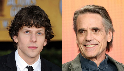

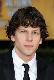

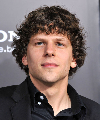

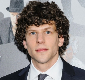

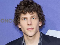

...

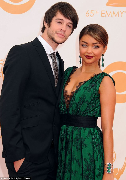

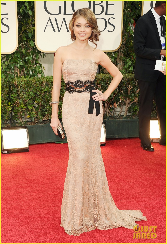

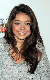

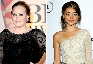

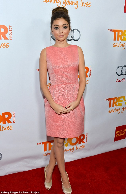

In [5]:
all_subjects = [subject for subject in sorted(os.listdir(os.path.join(base_path, "vgg_face_dataset", "files"))) if subject.startswith("Jesse_Eisenberg") or subject.startswith("Sarah_Hyland") or subject.startswith("Michael_Cera") or subject.startswith("Mila_Kunis") and subject.endswith(".txt")]

nb_subjects = 4
nb_images_per_subject = 40

images = []
for subject in all_subjects[:nb_subjects]:

  with open(os.path.join(base_path, "vgg_face_dataset", "files", subject), 'r') as f:
    lines = f.readlines()

  images_ = []
  for line in lines:
    url = line[line.find("http://"): line.find(".jpg") + 4]

    try:
      res = request.urlopen(url)
      img = np.asarray(bytearray(res.read()), dtype="uint8")
      img = cv2.imdecode(img, cv2.IMREAD_COLOR)
      h, w = img.shape[:2]
      images_.append(img)
      cv2_imshow(cv2.resize(img, (w // 5, h // 5)))

    except:
      pass

    if len(images_) == nb_images_per_subject:
      images.append(images_)
      break

> This function takes the images that were just fetched and saves them to an individual filename. This makes them easier to access for later stages of the project, such as training a model.



In [6]:
# save faces to appropriate directories
def save_faces(images, directory, firstname, lastname):
    for i, img in enumerate(images):
        filename = os.path.join(base_path, "faces", directory, f"{firstname}_{lastname}_{i}.jpg")
        cv2.imwrite(filename, img)

## Splitting data

Now it's time to plit our dataset into a training and validation set. We do this all the way in the beginning, such that no validation data is influencing the training procedure.

*   **Train set:** this is used to train the machine learning model. It's through exposure to this data that the model learns the patterns, features, and relationships within the data. The model iteratively adjusts its parameters to minimize errors in predictions or classifications made on the training data.

*   **Validation set:** this set evaluates the model's performance on data it hasn't seen during training. This helps in assessing how well the model generalizes to new, unseen data.

The validation set should be a standalone, independent set that remains untouched during the training of the model(s). Mixing/using informaiton of the validation set during training can lead to skewed end results.


In [7]:
# create directories for saving faces
for person in ['train/male', 'train/female', 'valid/male', 'valid/female']:
  os.makedirs(os.path.join(base_path, "faces", person), exist_ok=True)
# 'exist_ok=True' parameter allows the function to run without error even if some directories already exist


## Face detection set up

Face recognition is often described as a process that first involves four steps; they are: face detection, face alignment, feature extraction, and finally face recognition.

1. Face Detection. Locate one or more faces in the image and mark with a bounding box.
2. Face Alignment. Normalize the face to be consistent with the database, such as geometry and photometrics.
3. Feature Extraction. Extract features from the face that can be used for the recognition task.
4. Face Recognition. Perform matching of the face against one or more known faces in a prepared database.
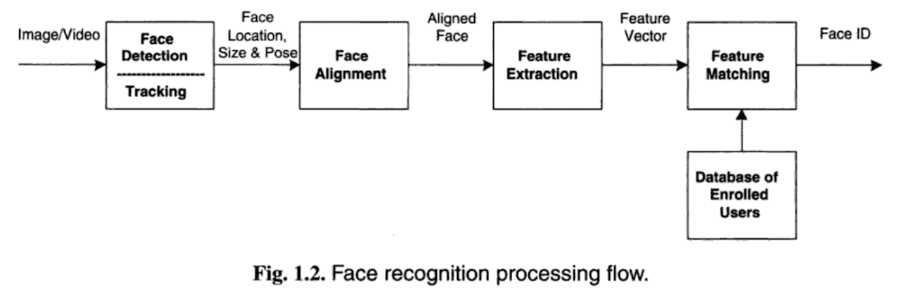

A given system may have a separate module or program for each step, which was traditionally the case, or may combine some or all of the steps into a single process.

> The code iterates over the subjects and their corresponding images. For each image, it creates a grayscale copy, which is commonly done in face detection to simplify the image and reduce computation.

> The *detectMultiScale* method is used to detect faces in the image. This method returns the coordinates of rectangles where it believes faces are located.For each detected face, a rectangle is drawn around it in the image, indicating the face's location. Each image is resized to 224x224 pixel. This is good practice for input into a neural network, especially if using a pre-trained model which expects input images of a specific size.

> Lastly, the processed image is appended to the corresponding list. This step categorizes the images by subject, preparing them for further analysis or model training.

Found 2 face(s)!


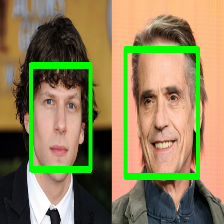

Found 1 face(s)!


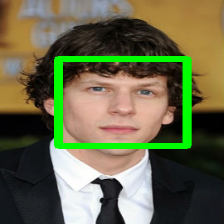

Found 1 face(s)!


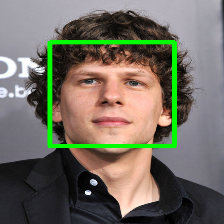

Found 1 face(s)!


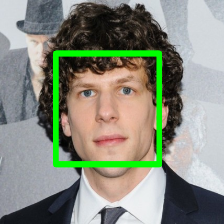

Found 1 face(s)!


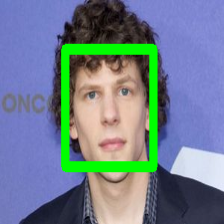

Found 1 face(s)!


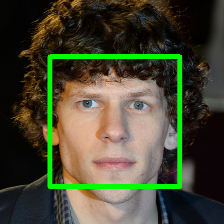

Found 1 face(s)!


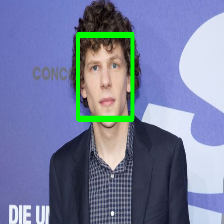

Found 2 face(s)!


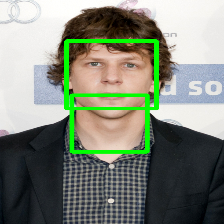

Found 1 face(s)!


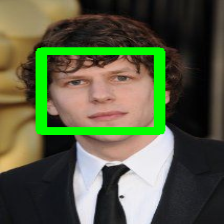

Found 1 face(s)!


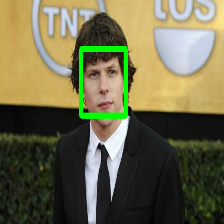

Found 1 face(s)!


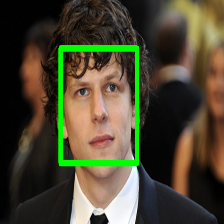

Found 1 face(s)!


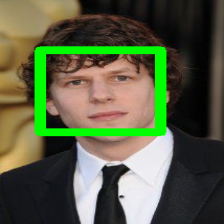

Found 1 face(s)!


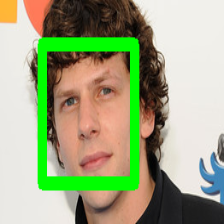

Found 0 face(s)!


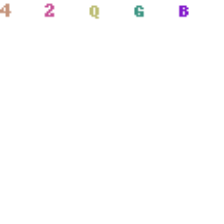

Found 1 face(s)!


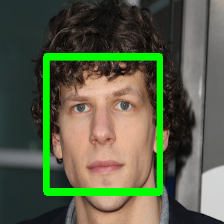

Found 1 face(s)!


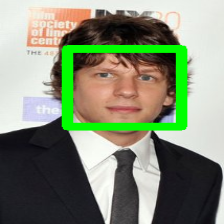

Found 2 face(s)!


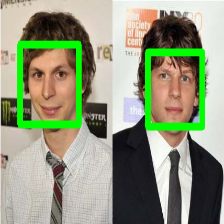

Found 1 face(s)!


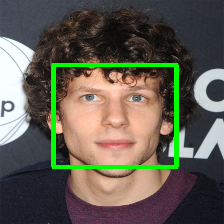

Found 1 face(s)!


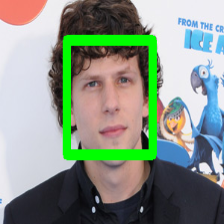

Found 1 face(s)!


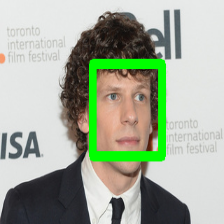

Found 4 face(s)!


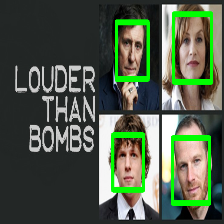

Found 1 face(s)!


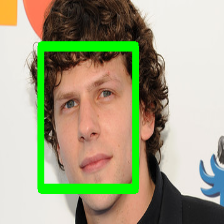

Found 1 face(s)!


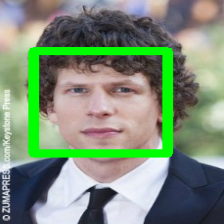

Found 1 face(s)!


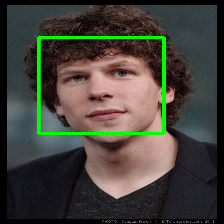

Found 1 face(s)!


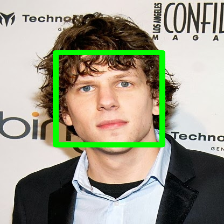

Found 1 face(s)!


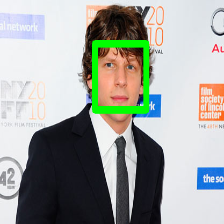

Found 1 face(s)!


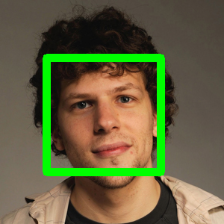

Found 2 face(s)!


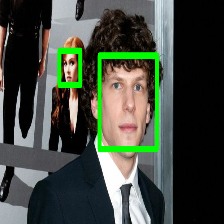

Found 1 face(s)!


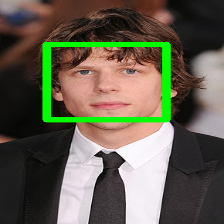

Found 1 face(s)!


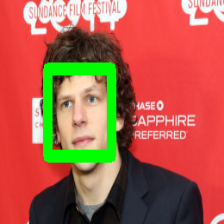

Found 2 face(s)!


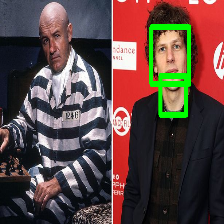

Found 1 face(s)!


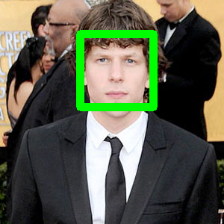

Found 1 face(s)!


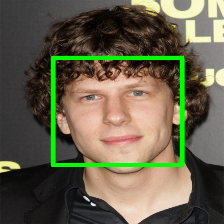

Found 1 face(s)!


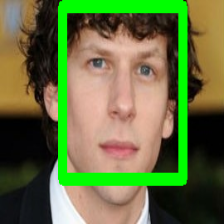

Found 1 face(s)!


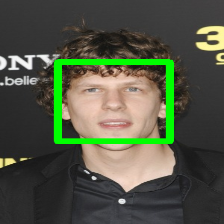

Found 1 face(s)!


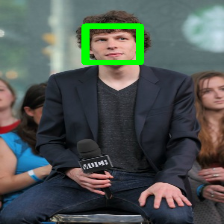

Found 1 face(s)!


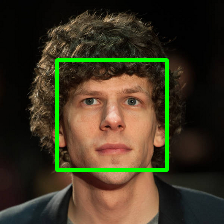

Found 1 face(s)!


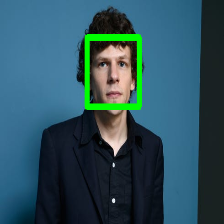

Found 1 face(s)!


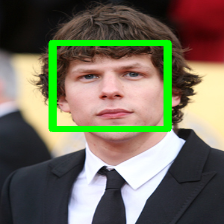

Found 1 face(s)!


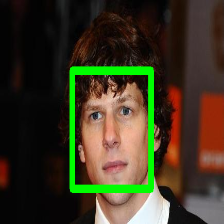

Found 1 face(s)!


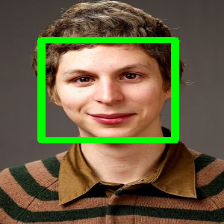

Found 1 face(s)!


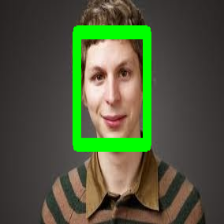

Found 1 face(s)!


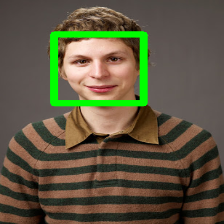

Found 1 face(s)!


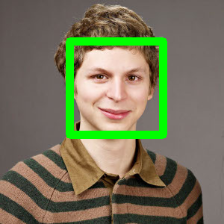

Found 1 face(s)!


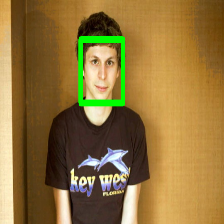

Found 1 face(s)!


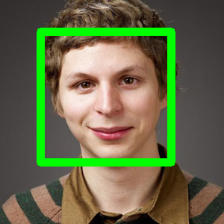

Found 0 face(s)!


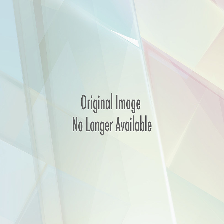

Found 1 face(s)!


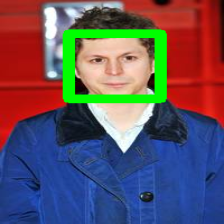

Found 1 face(s)!


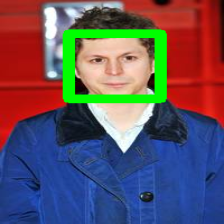

Found 2 face(s)!


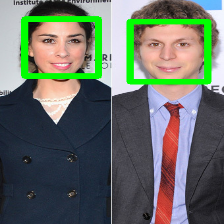

Found 1 face(s)!


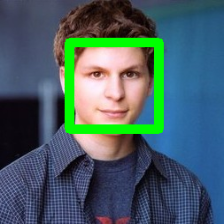

Found 1 face(s)!


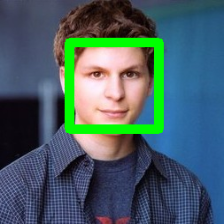

Found 2 face(s)!


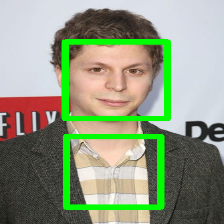

Found 1 face(s)!


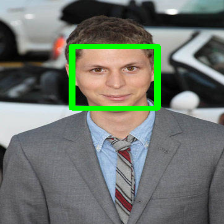

Found 1 face(s)!


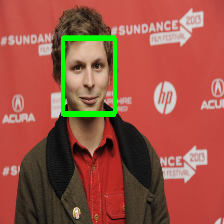

Found 1 face(s)!


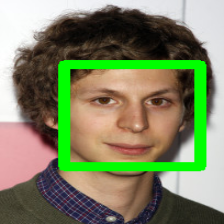

Found 1 face(s)!


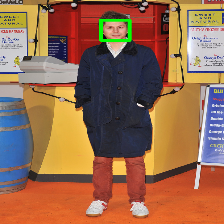

Found 1 face(s)!


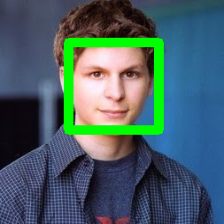

Found 1 face(s)!


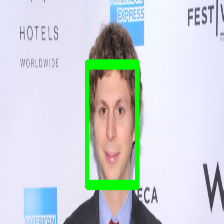

Found 2 face(s)!


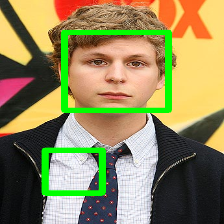

Found 1 face(s)!


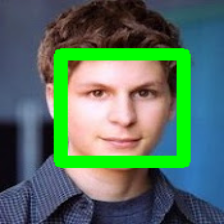

Found 1 face(s)!


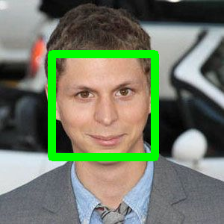

Found 1 face(s)!


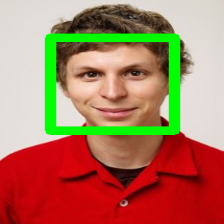

Found 1 face(s)!


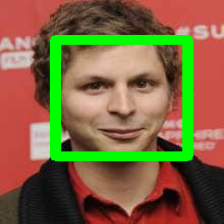

Found 1 face(s)!


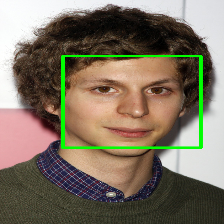

Found 1 face(s)!


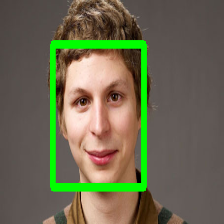

Found 1 face(s)!


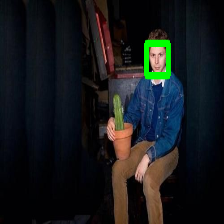

Found 1 face(s)!


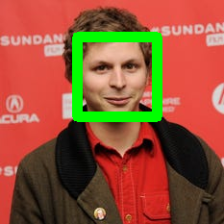

Found 1 face(s)!


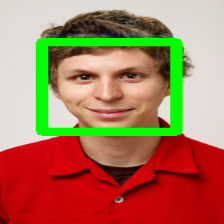

Found 1 face(s)!


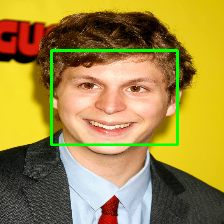

Found 1 face(s)!


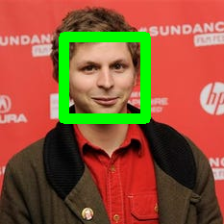

Found 1 face(s)!


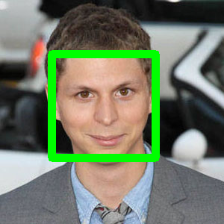

Found 1 face(s)!


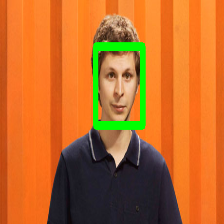

Found 1 face(s)!


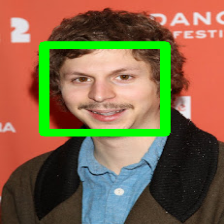

Found 1 face(s)!


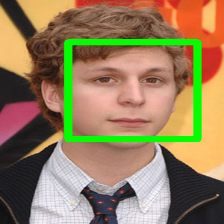

Found 1 face(s)!


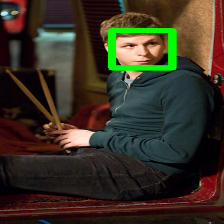

Found 1 face(s)!


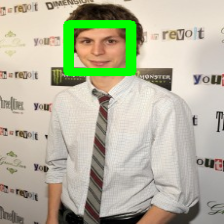

Found 1 face(s)!


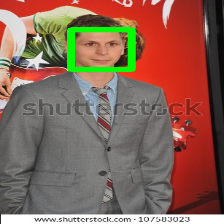

Found 0 face(s)!


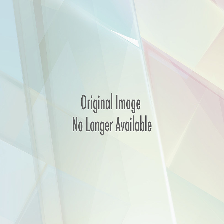

Found 1 face(s)!


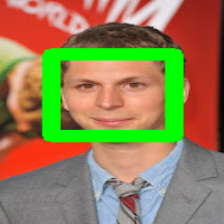

Found 1 face(s)!


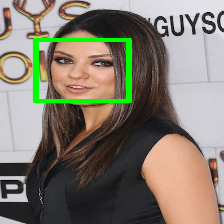

Found 1 face(s)!


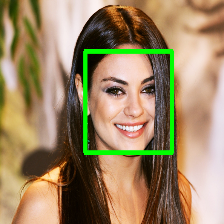

Found 2 face(s)!


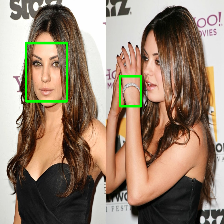

Found 1 face(s)!


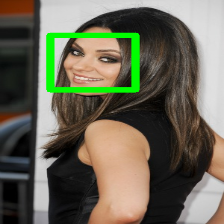

Found 1 face(s)!


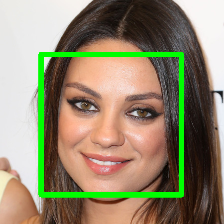

Found 1 face(s)!


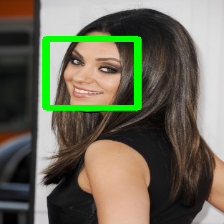

Found 1 face(s)!


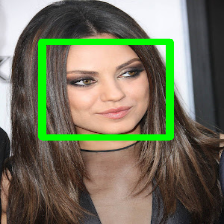

Found 1 face(s)!


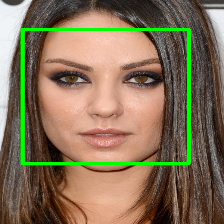

Found 0 face(s)!


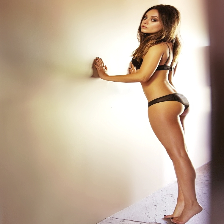

Found 1 face(s)!


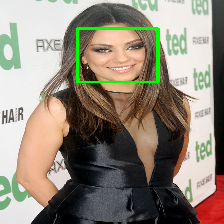

Found 1 face(s)!


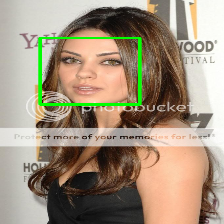

Found 4 face(s)!


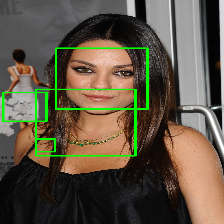

Found 1 face(s)!


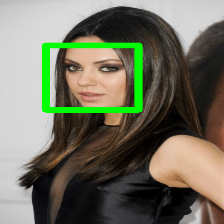

Found 1 face(s)!


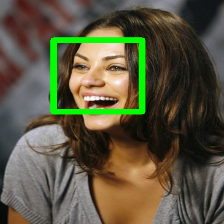

Found 1 face(s)!


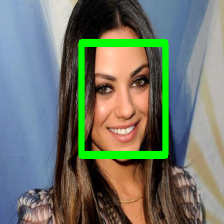

Found 1 face(s)!


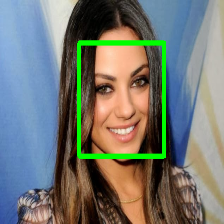

Found 1 face(s)!


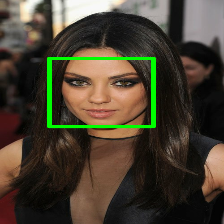

Found 1 face(s)!


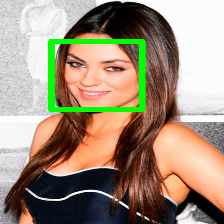

Found 1 face(s)!


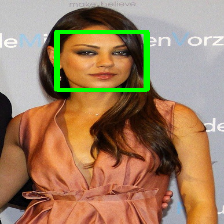

Found 2 face(s)!


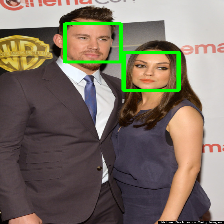

Found 2 face(s)!


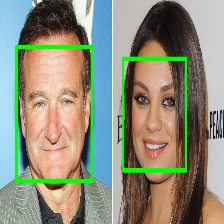

Found 1 face(s)!


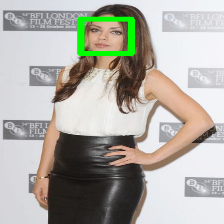

Found 2 face(s)!


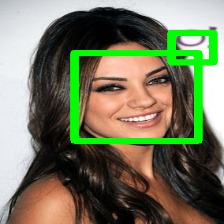

Found 1 face(s)!


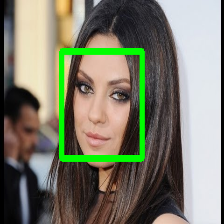

Found 1 face(s)!


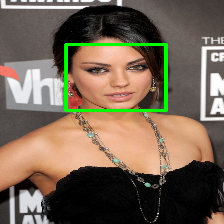

Found 1 face(s)!


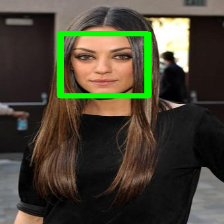

Found 1 face(s)!


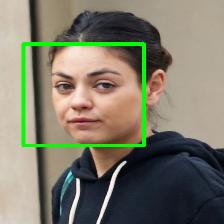

Found 1 face(s)!


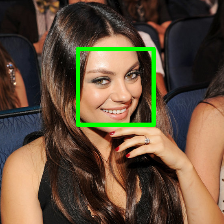

Found 2 face(s)!


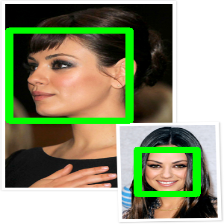

Found 1 face(s)!


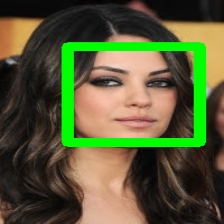

Found 1 face(s)!


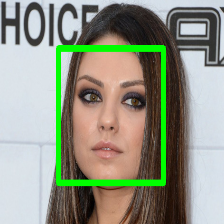

Found 1 face(s)!


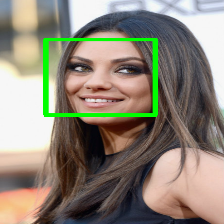

Found 1 face(s)!


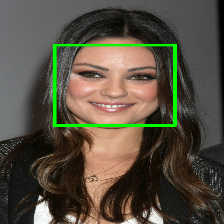

Found 1 face(s)!


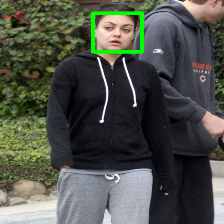

Found 2 face(s)!


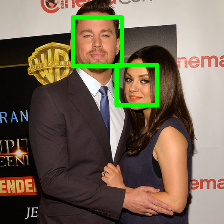

Found 2 face(s)!


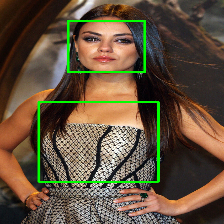

Found 1 face(s)!


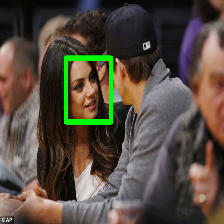

Found 1 face(s)!


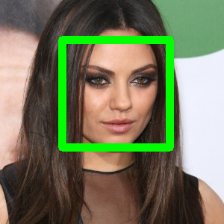

Found 1 face(s)!


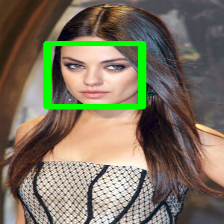

Found 1 face(s)!


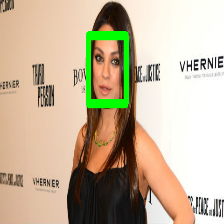

Found 1 face(s)!


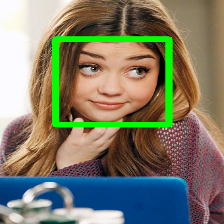

Found 1 face(s)!


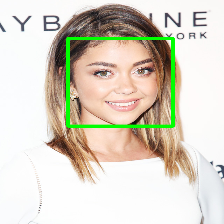

Found 1 face(s)!


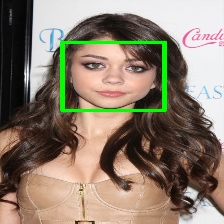

Found 2 face(s)!


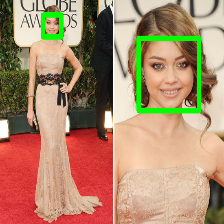

Found 1 face(s)!


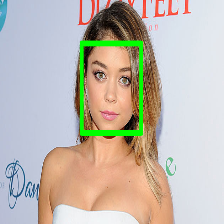

Found 1 face(s)!


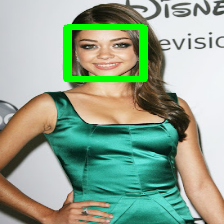

Found 1 face(s)!


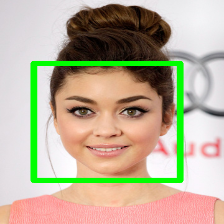

Found 1 face(s)!


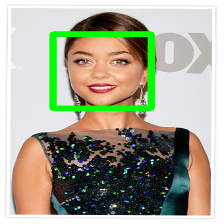

Found 1 face(s)!


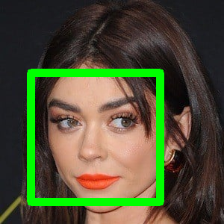

Found 1 face(s)!


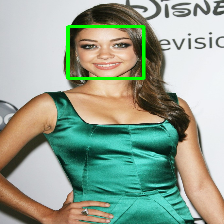

Found 2 face(s)!


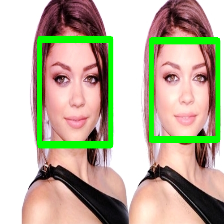

Found 1 face(s)!


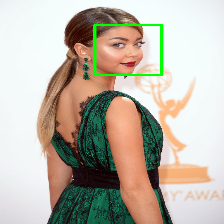

Found 1 face(s)!


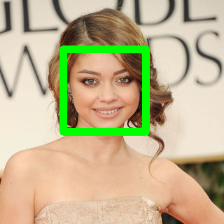

Found 1 face(s)!


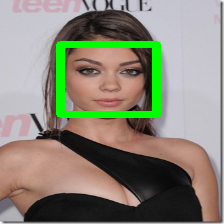

Found 1 face(s)!


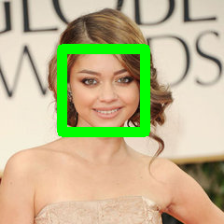

Found 1 face(s)!


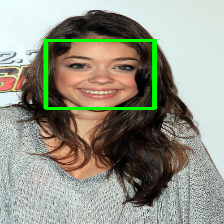

Found 1 face(s)!


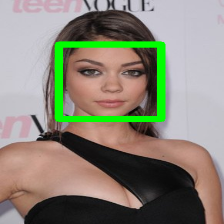

Found 1 face(s)!


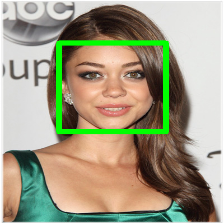

Found 1 face(s)!


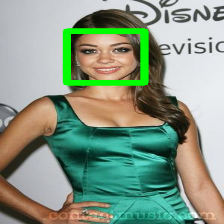

Found 1 face(s)!


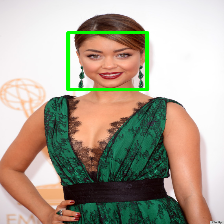

Found 2 face(s)!


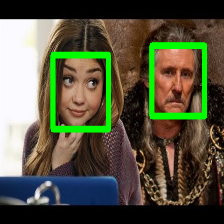

Found 2 face(s)!


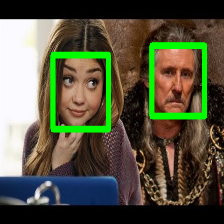

Found 1 face(s)!


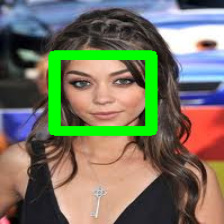

Found 1 face(s)!


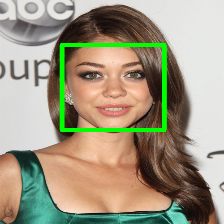

Found 1 face(s)!


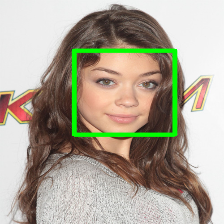

Found 1 face(s)!


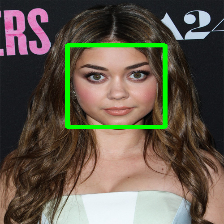

Found 3 face(s)!


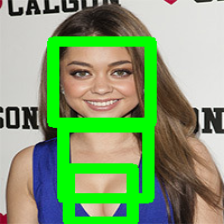

Found 2 face(s)!


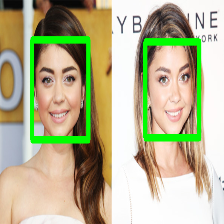

Found 1 face(s)!


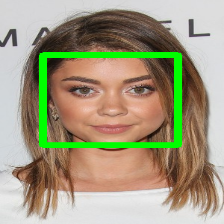

Found 1 face(s)!


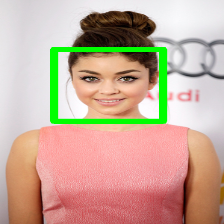

Found 1 face(s)!


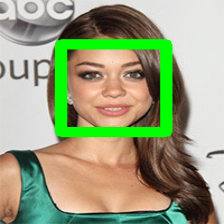

Found 1 face(s)!


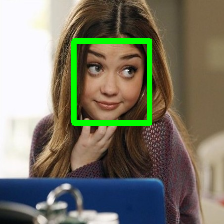

Found 3 face(s)!


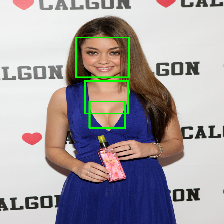

Found 1 face(s)!


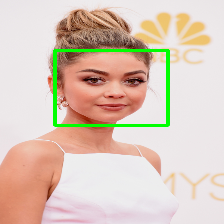

Found 1 face(s)!


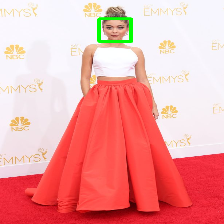

Found 2 face(s)!


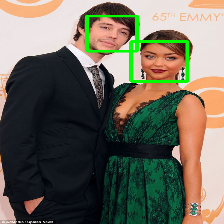

Found 1 face(s)!


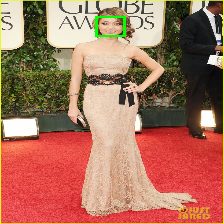

Found 1 face(s)!


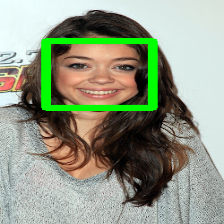

Found 2 face(s)!


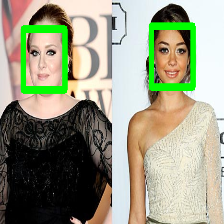

Found 1 face(s)!


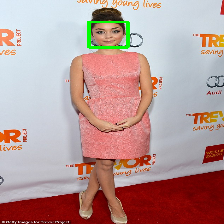

In [8]:
# create arrays for all 4 celebrities
jesse_images = []
michael_images = []
mila_images = []
sarah_images = []

faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

for subject, images_ in zip(all_subjects, images):

  for img in images_:
    img_ = img.copy()
    img_gray = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
    faces = faceCascade.detectMultiScale(
        img_gray,
        scaleFactor=1.2,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    print("Found {} face(s)!".format(len(faces)))

    for (x, y, w, h) in faces:
        cv2.rectangle(img_, (x, y), (x+w, y+h), (0, 255, 0), 10)

    h, w = img_.shape[:2]
    resized_img = cv2.resize(img_, (224, 224))
    cv2_imshow(resized_img)

    if "Jesse_Eisenberg" in subject:
        jesse_images.append(resized_img)
    elif "Michael_Cera" in subject:
        michael_images.append(resized_img)
    elif "Mila_Kunis" in subject:
        mila_images.append(resized_img)
    elif "Sarah_Hyland" in subject:
        sarah_images.append(resized_img)


## Split the images into the sets

This step is essential for training models and accurately assessing their performance, especially in tasks that require careful balancing and representation of different classes or categories, such as gender-based classification.

In [9]:
def split_images(images, train_size):
    training_images = images[:train_size]
    validation_images = images[train_size:train_size + 10]
    return training_images, validation_images

michael_training, michael_testing = split_images(michael_images, 20)
mila_training, mila_testing = split_images(mila_images, 20)

jesse_testing = jesse_images[:10]
sarah_testing = sarah_images[:10]

# Save the split images
save_faces(michael_training, 'train/male', 'Michael', 'Cera')
save_faces(michael_testing, 'valid/male', 'Michael', 'Cera')
save_faces(mila_training, 'train/female', 'Mila', 'Kunis')
save_faces(mila_testing, 'valid/female', 'Mila', 'Kunis')

# Since Jesse and Sarah are only for testing, save them directly to the test directory
save_faces(jesse_testing, 'valid/male', 'Jesse', 'Eisenberg')
save_faces(sarah_testing, 'valid/female', 'Sarah', 'Hyland')

## Data augmentation

The accuracy of deep learning models largely depends on the quality, quantity, and contextual meaning of training data. However, data scarcity is one of the most common challenges in building deep learning models. In production use cases, collecting such data can be costly and time-consuming.

Companies leverage a low-cost and effective method—data augmentation to reduce dependency on the collection and preparation of training examples and build high-precision AI models quicker.

Data augmentation is a process of artificially increasing the amount of data by generating new data points from existing data. This includes adding minor alterations to data or using machine learning models to generate new data points in the latent space of original data to amplify the dataset.

A question may arise about the difference between augmented data and synthetic data.

- Synthetic data: When data is generated artificially without using real-world images. Synthetic data are often produced by Generative Adversarial Networks

- Augmented data: Derived from original images with some sort of minor geometric transformations (such as flipping, translation, rotation, or the addition of noise) in order to increase the diversity of the training set.

Data augmentation improves the performance of ML models through more diverse datasets, and reduces operation costs related to data collection.

>   Flip Left-Right: Images are randomly flipped horizontally with a probability of 0.7. This simulates the variation due to different orientations of subjects in images.

>   Rotation: The images are rotated slightly (up to 10 degrees in both directions) with a probability of 0.7. This adds variability to the dataset by simulating different head poses.

>   Greyscale Conversion: With a probability of 0.1, the images are converted to greyscale. This ensures the model can process and learn from images irrespective of their color information.

>   Sampling: The sample(50) method generates 50 augmented images from the original set. This expands the dataset, providing more data for the model to learn from.


In [10]:
pipeline_male = Augmentor.Pipeline(source_directory='/content/sample_data/deep_learning_assignment/faces/train/male', output_directory='/content/sample_data/deep_learning_assignment/faces/train_augmented/male')
pipeline_male.flip_left_right(probability=0.7)
pipeline_male.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
pipeline_male.greyscale(probability=0.1)
pipeline_male.sample(50)

pipeline_female = Augmentor.Pipeline(source_directory='/content/sample_data/deep_learning_assignment/faces/train/female', output_directory='/content/sample_data/deep_learning_assignment/faces/train_augmented/female')
pipeline_female.flip_left_right(probability=0.7)
pipeline_female.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
pipeline_female.greyscale(probability=0.1)
pipeline_female.sample(50)

Initialised with 20 image(s) found.
Output directory set to /content/sample_data/deep_learning_assignment/faces/train_augmented/male.

Processing <PIL.Image.Image image mode=L size=224x224 at 0x7D89A0003850>: 100%|██████████| 50/50 [00:00<00:00, 117.51 Samples/s]


Initialised with 20 image(s) found.
Output directory set to /content/sample_data/deep_learning_assignment/faces/train_augmented/female.

Processing <PIL.Image.Image image mode=L size=224x224 at 0x7D89A007F940>: 100%|██████████| 50/50 [00:00<00:00, 81.82 Samples/s]


## Load the VGG16 Model

#### What is VGG16

A convolutional neural network is also known as a ConvNet, which is a kind of artificial neural network. A convolutional neural network has an input layer, an output layer, and various hidden layers. VGG16 is a type of CNN (Convolutional Neural Network) that is considered to be one of the best computer vision models to date. The creators of this model evaluated the networks and increased the depth using an architecture with very small (3 × 3) convolution filters, which showed a significant improvement on the prior-art configurations. They pushed the depth to 16–19 weight layers making it approx — 138 trainable parameters.

#### What is VGG16 used for

VGG16 is object detection and classification algorithm which is able to classify 1000 images of 1000 different categories with 92.7% accuracy. It is one of the popular algorithms for image classification and is easy to use with transfer learning.

#### VGG16 Architecture
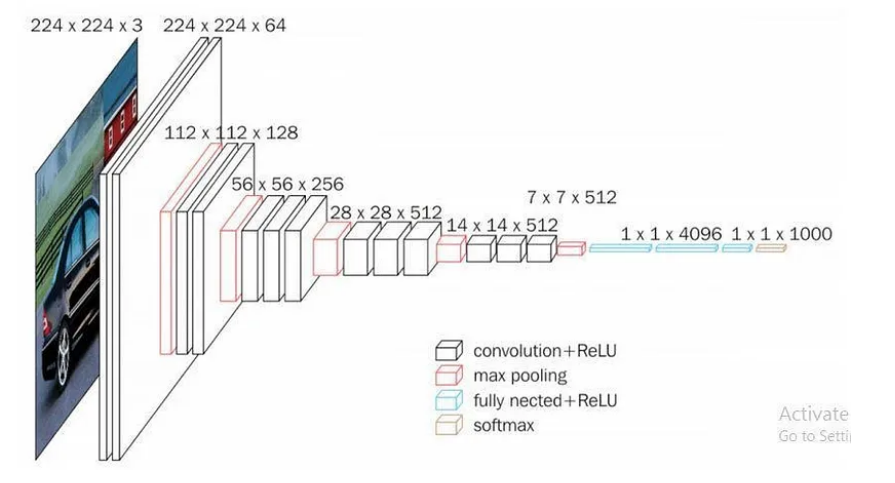

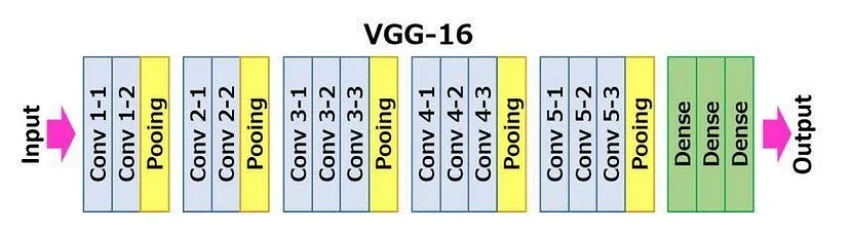

- The 16 in VGG16 refers to 16 layers that have weights. In VGG16 there are thirteen convolutional layers, five Max Pooling layers, and three Dense layers which sum up to 21 layers but it has only sixteen weight layers i.e., learnable parameters layer.
- VGG16 takes input tensor size as 224, 244 with 3 RGB channel
Most unique thing about VGG16 is that instead of having a large number of hyper-parameters they focused on having convolution layers of 3x3 filter with stride 1 and always used the same padding and maxpool layer of 2x2 filter of stride 2.
- The convolution and max pool layers are consistently arranged throughout the whole architecture
- Conv-1 Layer has 64 number of filters, Conv-2 has 128 filters, Conv-3 has 256 filters, Conv 4 and Conv 5 has 512 filters.
- Three Fully-Connected (FC) layers follow a stack of convolutional layers: the first two have 4096 channels each, the third performs 1000-way ILSVRC classification and thus contains 1000 channels (one for each class). The final layer is the soft-max layer.

In [11]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 2s 0us/step


## Prepare the base model

Set the base_model layers as non-trainable. This step is really important because we need to use the pre-trained weights without altering them during the training process.

In [12]:
# Set the layers of the base model to be non-trainable
for layer in base_model.layers:
    layer.trainable = False

## Modify the Model for Binary Classification

To make sure that the model will classify the images correctly, we need to extend the model with additional layers.

>   Global Average Pooling 2D Layer: This layer condenses the feature maps obtained from VGG16 into a single 1D vector per map. It simplifies the output and reduces the total number of parameters, aiding in the prevention of overfitting.

> Dense Layers: A sequence of fully connected (Dense) layers are added. Each layer contains a specified number of units (1024, 512, and 256), chosen based on common practices and experimentation. These layers further process the features extracted by VGG16.

> Output Layer: The final Dense layer uses sigmoid activation suitable for binary classification (our two classes being 'female' and 'male').

In [13]:
x = base_model.output
x = GlobalAveragePooling2D()(x)

# dense layers
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
# add a logistic layer for binary classification
x = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=x)

## Compile the model

Compile the model to prepare it for training and examine the model structure.

#### What is the Adam optimization algorithm?

Adam is an optimization algorithm that can be used instead of the classical stochastic gradient descent procedure to update network weights iterative based in training data.

#### How does Adam Optimization Work?
Adam optimization combines the benefits of two other optimization algorithms - Momentum and RMSProp. The momentum algorithm uses the previous gradient to smooth out fluctuations in the optimization process, while RMSProp scales the learning rate based on the magnitude of the recent gradients. Adam optimization takes these ideas one step further by computing an exponential moving average of both the gradients and their squares to adaptively adjust the learning rates.

Adam is an adaptive learning rate approach that computes individual learning rates for various parameters. Its name is derived from adaptable moment estimation, and Adam employs estimations of the first and second moments of the gradient to change the learning rate for each weight of the neural network.

In [14]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

## Fit the Model

This part is used for setting up image data preprocessing, augmentation, and model training in a deep learning context.



>   **ImageDataGenerator** is a class in Keras used for real-time data augmentation and preprocessing. It generates batches of tensor image data with real-time data augmentation.

In [15]:
train_datagen = ImageDataGenerator()

training_set = train_datagen.flow_from_directory(
    '/content/sample_data/deep_learning_assignment/faces/train_augmented',
    batch_size=30,
    class_mode='binary'
)

validation_datagen = ImageDataGenerator()

validation_set = validation_datagen.flow_from_directory(
    '/content/sample_data/deep_learning_assignment/faces/valid',
    batch_size=30,
    class_mode='binary'
)

model.fit(training_set, epochs=10, validation_data=validation_set)

Found 100 images belonging to 2 classes.
Found 40 images belonging to 2 classes.
Epoch 1/10
4/4 [==============================] - 127s 33s/step - loss: 3.3835 - accuracy: 0.5300 - val_loss: 2.3147 - val_accuracy: 0.5000
Epoch 2/10
4/4 [==============================] - 116s 30s/step - loss: 0.6843 - accuracy: 0.7100 - val_loss: 0.7083 - val_accuracy: 0.7250
Epoch 3/10
4/4 [==============================] - 124s 33s/step - loss: 0.1529 - accuracy: 0.9200 - val_loss: 0.6125 - val_accuracy: 0.7250
Epoch 4/10
4/4 [==============================] - 127s 34s/step - loss: 0.0343 - accuracy: 0.9900 - val_loss: 0.6916 - val_accuracy: 0.7750
Epoch 5/10
4/4 [==============================] - 124s 33s/step - loss: 0.0136 - accuracy: 1.0000 - val_loss: 0.3362 - val_accuracy: 0.9000
Epoch 6/10
4/4 [==============================] - 125s 33s/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.4959 - val_accuracy: 0.8000
Epoch 7/10
4/4 [==============================] - 122s 32s/step - loss: 0.0020 

- **epochs:** the number of epochs specifies how many times the entire training dataset will be passed forward and backward through the neural network. In this case, the model will go through the training data 10 times. An epoch is one complete presentation of the data set to be learned to a learning machine.
- **batch_size:** this parameter defines the number of samples that will be propagated through the network at one time. Here, we are using a batch size of 30, meaning the model will take 30 images at a time, process them, update the weights, and then proceed to the next batch of 30 images.

## Prediction and evaluation

The model's performance is assessed on the validation set. This gives an idea of how well the model performs unseen data.

The model makes predictions on the validation dataset. A threshold is applied to these predictions to classify each image into one of two classes (for instance, 'male' or 'female').

This process is crucial for understanding the effectiveness of the model in practical scenarios, beyond just numerical performance metrics.

In [16]:
# Evaluate the model on the validation set
validation_loss, validation_accuracy = model.evaluate(validation_set)

print(f"Validation Accuracy: {validation_accuracy * 100:.2f}%")
print(f"Validation Loss: {validation_loss}")

# Make predictions on the validation set
validation_predictions = model.predict(validation_set)

# Apply threshold to determine class
threshold = 0.5
predicted_classes = (validation_predictions > threshold).astype(int)

# Display the predicted classes along with image names
for i in range(len(validation_set.filenames)):
    filename = validation_set.filenames[i]
    prediction = predicted_classes[i][0]  # Binary predictions, extract single value

    class_name = 'male' if prediction == 0 else 'female'
    print(f"Image: {filename}, Predicted Class: {class_name}\n")

2/2 [==============================] - 39s 11s/step - loss: 0.5804 - accuracy: 0.8750
Validation Accuracy: 87.50%
Validation Loss: 0.5803598165512085
2/2 [==============================] - 46s 11s/step
Image: female/Mila_Kunis_0.jpg, Predicted Class: female

Image: female/Mila_Kunis_1.jpg, Predicted Class: male

Image: female/Mila_Kunis_2.jpg, Predicted Class: female

Image: female/Mila_Kunis_3.jpg, Predicted Class: male

Image: female/Mila_Kunis_4.jpg, Predicted Class: female

Image: female/Mila_Kunis_5.jpg, Predicted Class: male

Image: female/Mila_Kunis_6.jpg, Predicted Class: female

Image: female/Mila_Kunis_7.jpg, Predicted Class: female

Image: female/Mila_Kunis_8.jpg, Predicted Class: female

Image: female/Mila_Kunis_9.jpg, Predicted Class: female

Image: female/Sarah_Hyland_0.jpg, Predicted Class: male

Image: female/Sarah_Hyland_1.jpg, Predicted Class: female

Image: female/Sarah_Hyland_2.jpg, Predicted Class: female

Image: female/Sarah_Hyland_3.jpg, Predicted Class: female



**Even though the accuracy is high for both the training and validation sets, so is the loss which might be an indication of overfitting, cauzing the predictions to be less accurate.**

## Visualisation

In [17]:
actual_labels = [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
predictions =   [1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1]

#### Confusion matrix

This is a fundamental tool for classification problems. It shows the number of correct and incorrect predictions categorized by the true classes. This helps in understanding which classes are being confused by the model.

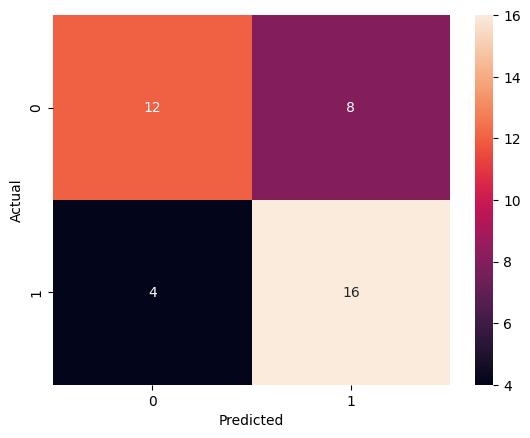

In [18]:
cm = confusion_matrix(actual_labels, predictions)

sns.heatmap(cm, annot=True, fmt='d')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

#### ROC Curve and AUC

For binary classification, the Receiver Operating Characteristic (ROC) curve and Area Under Curve (AUC) are useful to understand the trade-offs between true positive rate and false positive rate.

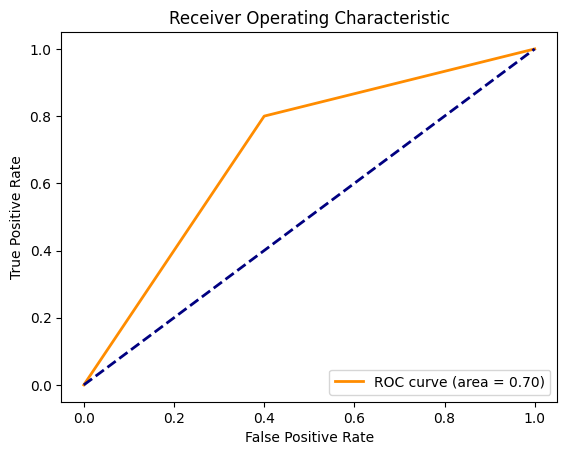

In [19]:
fpr, tpr, thresholds = roc_curve(actual_labels, predictions)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()